In [96]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [97]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.04 GB, difference -0.16 GB
scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [98]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *

In [99]:
home_dir = os.path.expanduser("~")
current_directory = os.getcwd()

adata = sc.read_h5ad(current_directory+"/backups/t_cells_umap_24181x37733_241024_13h05.h5ad")

# Initial clustering

running Leiden clustering
    finished (0:00:00)


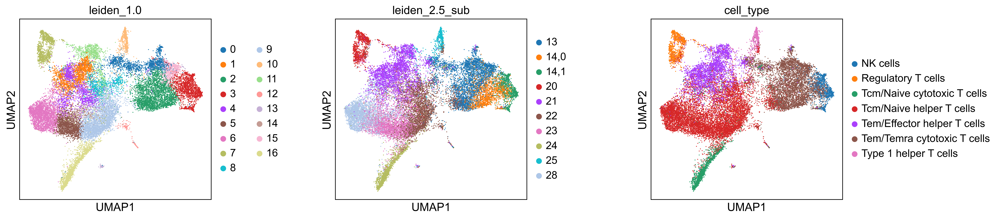

In [100]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 1, key_added = "leiden_1.0", random_state = 0)
sc.pl.umap(adata, color = ["leiden_1.0", "leiden_2.5_sub", "cell_type"], 
           alpha = 1, 
           wspace = 0.5,
           ncols = 3,
           s = 5,
           save = "_leiden_1.0_t_cells.png")
#  n_iterations = 2

running Leiden clustering
    finished (0:00:00)


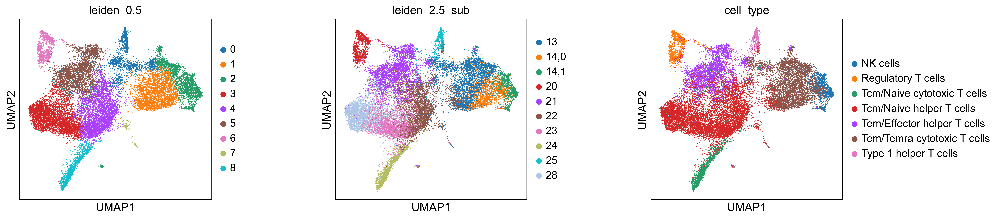

In [17]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 0.5, key_added = "leiden_0.5")
sc.pl.umap(adata, color = ["leiden_0.5", "leiden_2.5_sub", "cell_type"], 
           alpha = 1, 
           wspace = 0.5,
           ncols = 3,
           s = 5,
           save = "_leiden_0.5_t_cells.png")
#  n_iterations = 2

# Subclustering

In [153]:

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0", ["7"]), 
             resolution = 0.2,
             key_added = "leiden_1.0_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0_sub", ["0"]), 
             resolution = 0.4,
             key_added = "leiden_1.0_sub")


sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0_sub", ["12"]), 
             resolution = 0.1,
             key_added = "leiden_1.0_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0_sub", ["3"]), 
             resolution = 0.2,
             key_added = "leiden_1.0_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0_sub", ["8"]), 
             resolution = 0.2,
             key_added = "leiden_1.0_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_1.0_sub", ["2"]), 
             resolution = 0.4,
             key_added = "leiden_1.0_sub")



running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)


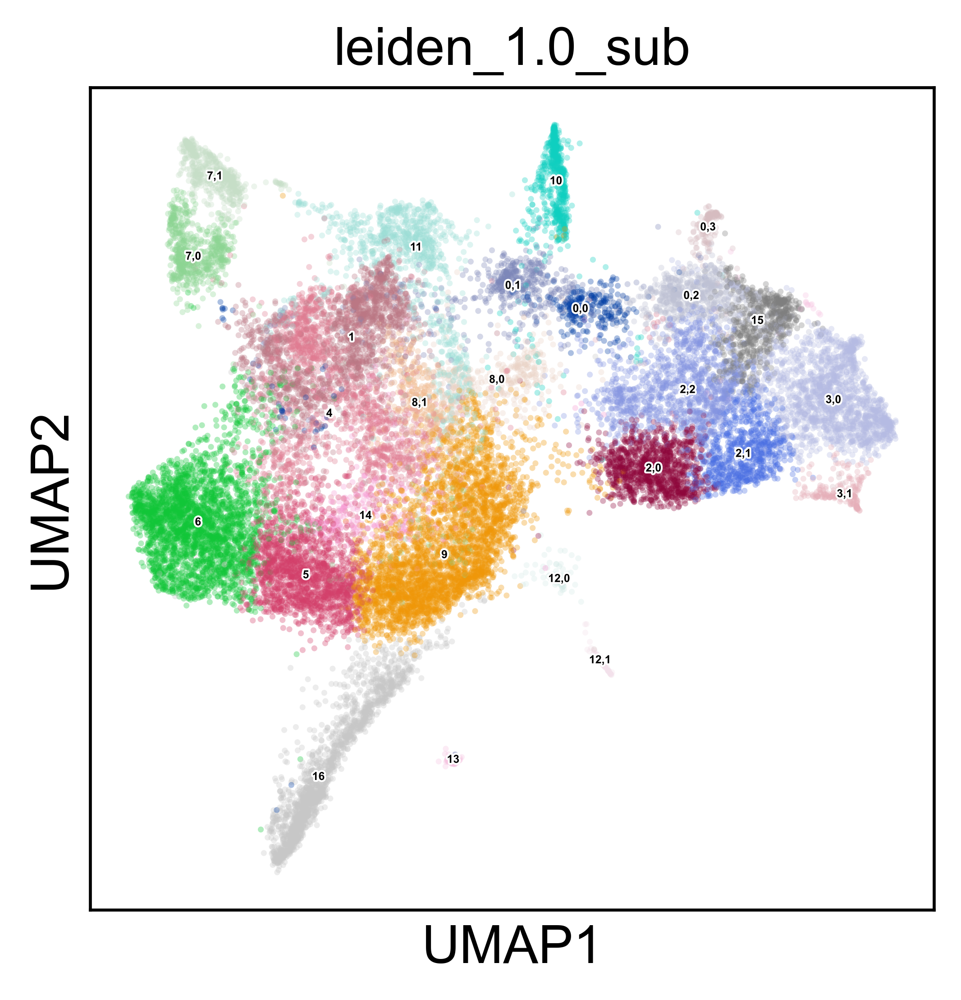

In [154]:
sc.pl.umap(adata, color = ["leiden_1.0_sub"], 
           alpha = 0.33, 
           wspace = 0.5,
           ncols = 3,
           s = 10, 
           legend_loc = "on data", legend_fontsize = 3, legend_fontoutline = True,
           save = "_leiden_1.0_sub_only_clean_t_cells.png")

In [156]:
# Saving obs dataframe

fname = 'backups/t_cells_clustering_leiden_1.0_sub_obs_%dx%d_%s'%(adata.obs.shape[0],adata.obs.shape[1],now())
print(fname)
save_df(adata.obs,fname)


backups/t_cells_clustering_leiden_1.0_sub_obs_24181x28_241025_13h27
